In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import moviepy
import cv2
import math
import tensorflow as tf
from IPython.display import clear_output
import tensorflow_probability as tfp

In [ ]:
fps = 20
train_files = range(0, 5)
frames_number=1200
fps_visual = 30

In [ ]:
for x in train_files:
  !wget https://raw.githubusercontent.com/commaai/calib_challenge/main/labeled/{x}.txt

!wget https://raw.githubusercontent.com/commaai/calib_challenge/main/labeled/0.hevc

--2024-01-18 15:43:53--  https://raw.githubusercontent.com/commaai/calib_challenge/main/labeled/0.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 60000 (59K) [text/plain]
Saving to: ‘0.txt’

0.txt               100%[===================>]  58.59K  --.-KB/s    in 0.01s   

2024-01-18 15:43:53 (4.18 MB/s) - ‘0.txt’ saved [60000/60000]

--2024-01-18 15:43:53--  https://raw.githubusercontent.com/commaai/calib_challenge/main/labeled/1.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 60000 (59K) [text/plain]
Saving to: ‘1.txt’

1.

In [ ]:
total = 0

print(list(train_files))

# for number in range():
#     # number = 0, 1, 2, 3, 4
#     total = total + 1

print(total)

[0, 1, 2, 3, 4]
0


In [ ]:
df_list = [
    pd.read_csv(f'{x}.txt', header=None, delimiter=' ')
    for x in range(1, 5)
]

1200

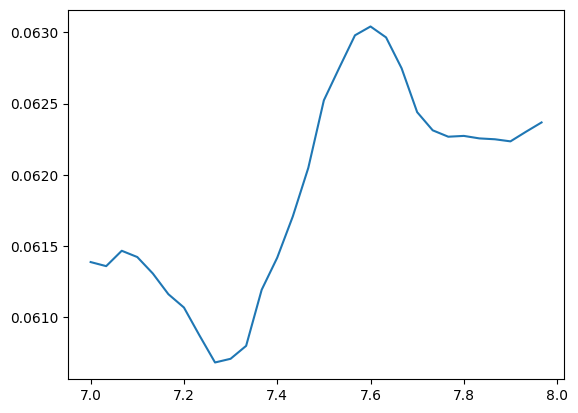

In [ ]:
np.arange(5, 10)


st = 7*fps_visual
en = 8*fps_visual

# st = 100
# en = 101

# st=int(0.7 * frames_number)
# st = 0
# en=frames_number


# print(np.arange(40, 200).shape)
# print(df_list[0][0][40:200].shape)
plt.plot(np.arange(st, en)/fps_visual, df_list[0][0][st:en])
len(df_list[0][0])

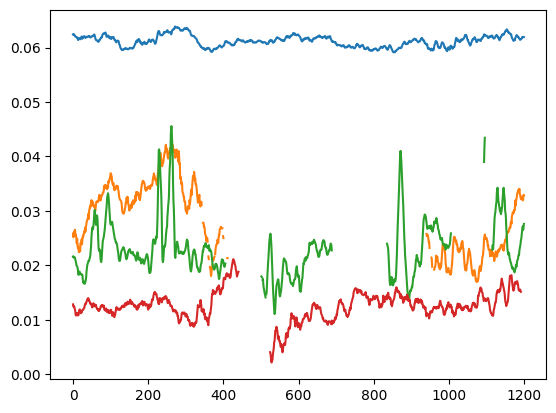

In [ ]:
for df in df_list:
  plt.plot(df[0])

In [ ]:
# moviepy.editor.ipython_display("0.hevc")
moviepy.editor.ipython_display("0.hevc.mp4")

In [ ]:
file_0 = cv2.VideoCapture("0.hevc.mp4")
file_0.get(cv2.CAP_PROP_FRAME_COUNT)

1199.0

In [ ]:
def visualize_flow(frame1, flow):
  magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

  # Create a color image representing the magnitude
  hsv = np.zeros_like(frame1)
  hsv[..., 1] = 255
  hsv[..., 0] = angle * 180 / np.pi / 2
  hsv[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

  # Convert HSV to BGR for display
  rgb_flow = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

  # Display the optical flow
  plt.imshow(rgb_flow)
  plt.show()

def visualize_flow_arrow(frame, gray, flow):
  # Calculate the magnitude and angle of the optical flow vectors
  magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

  # Create an image with arrows
  h, w = gray.shape
  y, x = np.mgrid[0:h:10j, 0:w:10j].astype(int)

  print("h, w", h, w)
  print("y", y)
  print("x", x)

  arrows = np.column_stack((x.flatten(), y.flatten()))
  arrow_displacement = flow[arrows[:, 1], arrows[:, 0]]
  arrow_displacement *= 5  # Scale the arrow length

  # Create a copy of the second frame to overlay arrows
  result_frame = frame.copy()

  # Draw arrows on the image
  for (x, y), (dx, dy) in zip(arrows, arrow_displacement):
      cv2.arrowedLine(result_frame, (x, y), (int(x + dx), int(y + dy)), (0, 255, 0), 1)

  # Display the image with arrows
  plt.imshow(cv2.cvtColor(result_frame, cv2.COLOR_BGR2RGB))
  plt.show()

def visualize_optical_flow(image1, image2):
    # Convert images to grayscale
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Compute optical flow using Farneback method
    flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    # Compute magnitude and angle of optical flow
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

    # Normalize the magnitude for better visualization
    magnitude = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Convert angle to HSV color representation
    hsv = np.zeros_like(image1)
    hsv[..., 1] = 255
    hsv[..., 0] = angle * 180 / np.pi / 2
    hsv[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Convert HSV to BGR for display
    flow_rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

    # Plot the images and optical flow
    plt.figure(figsize=(12, 6))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)), plt.title('Frame 1')
    plt.subplot(122), plt.imshow(cv2.cvtColor(flow_rgb, cv2.COLOR_BGR2RGB)), plt.title('Optical Flow')
    plt.show()

def visualize_optical_flow_arrows(image1, image2):
    # Convert images to grayscale
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Compute optical flow using Farneback method
    flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    # Compute magnitude and angle of optical flow
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

    # Normalize the magnitude for better visualization
    magnitude = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Convert angle to Cartesian coordinates
    flow_dx = magnitude * np.cos(angle)
    flow_dy = magnitude * np.sin(angle)

    # Create a grid of coordinates
    x, y = np.meshgrid(np.arange(0, gray1.shape[1], 10), np.arange(0, gray1.shape[0], 10))

    # Sample flow at grid points
    sampled_dx = np.zeros_like(x)
    sampled_dy = np.zeros_like(y)

    for i in range(0, x.shape[0]):
        for j in range(0, x.shape[1]):
            sampled_dx[i, j] = flow_dx[y[i, j], x[i, j]]
            sampled_dy[i, j] = flow_dy[y[i, j], x[i, j]]

    # Plot the images and optical flow with arrows
    # plt.figure(figsize=(12, 6))
    # plt.subplot(121), plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)), plt.title('Frame 1')
    # plt.subplot(122),
    plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)), plt.title('Frame 2')

    # Add arrows to the second subplot
    plt.quiver(x, y, sampled_dx, sampled_dy, color='red', angles='xy', scale_units='xy', scale=1)

    plt.show()

-192153584101141.0
25.0
st, en 210 240


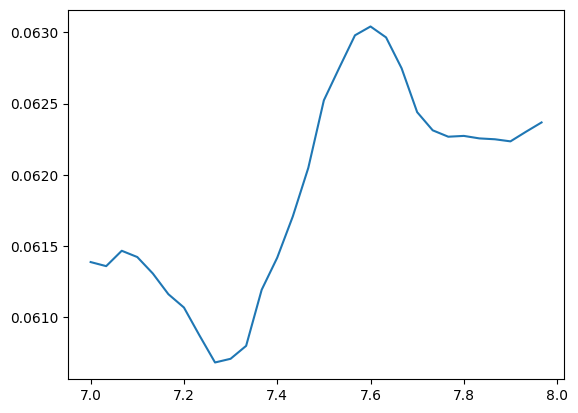

1200


In [ ]:


# Create a VideoCapture object
cap = cv2.VideoCapture("0.hevc")

# Read a frame from the video file
# ret, frame = cap.read()

print(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(cap.get(cv2.CAP_PROP_FPS))
# print(ret, frame.shape)

# # Convert the frame to a NumPy array
# frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)


print("st, en", st, en)
plt.plot(np.arange(st, en)/fps_visual, df_list[0][0][st:en])
plt.show()

frames_count = 0

prev_gray = None


print_images=False

while True:
    ret, frame = cap.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    if frames_count >= st and frames_count < en:
      if prev_gray is not None and print_images:
        print(cap.get(cv2.CAP_PROP_POS_FRAMES))
        visualize_optical_flow_arrows(prev_frame, frame)
        # flow = cv2.calcOpticalFlowFarneback(prev_frame, frame, None, 0.5, 3, 15, 3, 5, 1.2, 0)
        # flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
        # optical_flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3)
        # visualize_flow(frame, flow)
        # visualize_flow_arrow(frame, gray, flow)
        # optical_flow_array = np.array(flow)
        # plt.imshow(optical_flow_array, cmap="jet")
        # plt.show()

      # print(frames_count)
      # frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      # plt.imshow(frame)
      # plt.show()

    prev_gray = gray
    prev_frame = frame
    frames_count += 1

print(frames_count)


# # Plot the NumPy array
# plt.imshow(frame)
# plt.show()

# print(ret, frame.shape)

cap.release()

In [ ]:
cap = cv2.VideoCapture("0.hevc")

for i in range(0):
  cap.read()

ret, frame1 = cap.read()
ret, frame2 = cap.read()

gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

# flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)
flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)

cap.release()

[[5.        ]
 [5.        ]
 [2.23606798]]
[[0.8        0.6       ]
 [0.6        0.8       ]
 [0.4472136  0.89442719]]
(874, 1164, 2)
[[-0.00154734 -0.04272476]
 [ 0.0015551  -0.06737846]
 [ 0.00484617 -0.07642876]]
[[-0.03619264 -0.9993448 ]
 [ 0.02307395 -0.9997338 ]
 [ 0.06328055 -0.99799573]]
[0, 2, 4, 6, 8]
1164 874


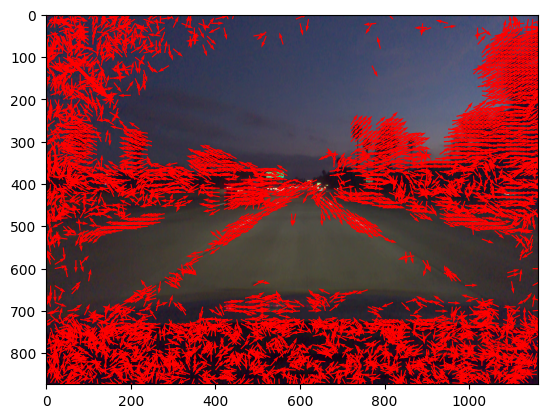

In [ ]:
plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))

v = np.array([[4, 3], [3, 4], [1, 2]])
print(np.linalg.norm(v, axis = 1)[:, np.newaxis])
# print(np.sqrt((vectors ** 2).sum(-1))[..., np.newaxis])
print(v / np.linalg.norm(v, axis = 1)[:, np.newaxis])


flow_norm = flow / np.linalg.norm(flow, axis = 2)[..., np.newaxis]

print(flow_norm.shape)
print(flow[0][:3])
print(flow_norm[0][:3])

print(list(range(0, 10, 2)))

h, w, _ = flow_norm.shape
print(w, h)

# print([[x0, y0] for x0 in range(0, h, 10) for y0 in range(0, h, 10)])

# print(np.meshgrid(range(0, h, 10), range(0, h, 10)))

qx = []
qy = []
qvx = []
qvy = []

for i in range(0, h, 10):
  for j in range(0, w, 10):
    # flow_vec = 50 * flow_norm[i][j]
    flow_vec = 5 * flow[i][j]
    if np.linalg.norm(flow_vec) > 1:
      v = 30 * flow_vec / np.linalg.norm(flow_vec)
      qx.append(j)
      qy.append(i)
      qvx.append(v[0])
      qvy.append(v[1])

# print(qx)

plt.quiver(qx, qy, qvx, qvy, color='red', angles='xy', scale_units='xy', scale=1)


# for i in range(0, h, 10):
#   for j in range(0, w, 10):
#     # flow_vec = 50 * flow_norm[i][j]
#     flow_vec = 10 * flow[i][j]
#     if np.linalg.norm(flow_vec) > 1:
#       v = 5 * flow_vec / np.linalg.norm(flow_vec)
#       plt.quiver(j, i, v[1], v[0], color='red', angles='xy', scale_units='xy', scale=1)

plt.quiver([50], [100], [100], [100], color='red', angles='xy', scale_units='xy', scale=1)


plt.show()

In [ ]:
def draw_flow_vecs(flow):
  flow_norm = flow / np.linalg.norm(flow, axis = 2)[..., np.newaxis]
  qx = []
  qy = []
  qvx = []
  qvy = []

  h, w, _ = flow.shape

  for i in range(0, h, 10):
    for j in range(0, w, 10):
      # flow_vec = 50 * flow_norm[i][j]
      flow_vec = 5 * flow[i][j]

      if np.linalg.norm(flow_vec) == 0:
        continue

      if np.linalg.norm(flow_vec) > 1:
        # v = 30 * flow_vec / np.linalg.norm(flow_vec)
        v = flow_vec
        qx.append(j)
        qy.append(i)
        qvx.append(v[0])
        qvy.append(v[1])

  plt.quiver(qx, qy, qvx, qvy, color='red', angles='xy', scale_units='xy', scale=1)

def get_frame_flow_n(n, p1=0.5, p2=3, p3=15, p4=3, p5=5, p6=1.2, p7=0):
  cap = cv2.VideoCapture("0.hevc")

  for i in range(n):
    cap.read()

  ret, frame1 = cap.read()
  ret, frame2 = cap.read()

  cap.release()

  gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
  gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

  # flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)
  flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, p1, p2, p3, p4, p5, p6, p7)

  return (frame2, flow)

def print_optical_flow(n, p1, p2, p3, p4, p5, p6, p7):

  (frame2, flow) = get_frame_flow_n(n, p1, p2, p3, p4, p5, p6, p7)

  plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
  draw_flow_vecs(flow)

  plt.show()

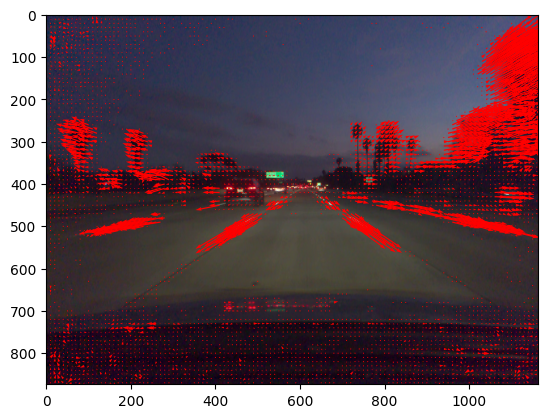

In [ ]:
(frame2, flow) = get_frame_flow_n(0, 0.5, 3, 15, 3, 5, 1.2, 0)
print_optical_flow(0, 0.5, 3, 15, 3, 5, 1.2, 0)

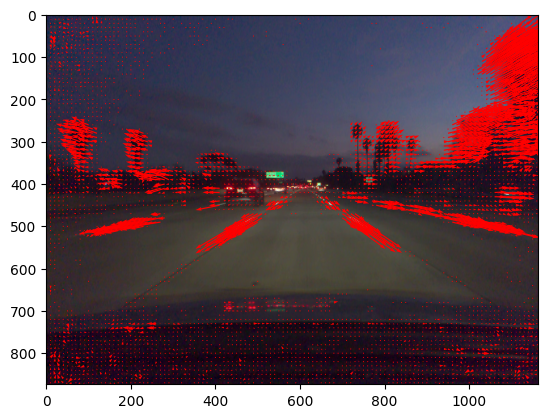

In [ ]:
for i in range(1):
  print_optical_flow(i, 0.5, 3, 15, 3, 5, 1.2, 0)

In [ ]:
h, w, _ = flow.shape

qx = []
qy = []
qvx = []
qvy = []

for i in range(0, h):
  for j in range(0, w):
    flow_vec = 5 * flow[i][j]
    if np.linalg.norm(flow_vec) > 1:
      v = flow_vec
      qx.append(j)
      qy.append(i)
      qvx.append(v[0])
      qvy.append(v[1])

In [ ]:
qx = [1, 3, 1.0]
qy = [1, 1, 0]
qvx = [1, -1, 0]
qvy = [1, 1, 1]

qx = [1, 3]
qy = [1, 1]
qvx = [1, -1]
qvy = [1, 1]

qx  = [0, 5]
qy  = [5, 0]
qvx = [1, 0]
qvy = [0, 1]

In [ ]:
l_a = []
l_b = []
l_c = []

for i in range(len(qx)):
  # l_l = math.sqrt(qvx[i] * qvx[i] + qvy[i] * qvy[i])
  l_l = 1
  l_a.append(qvy[i] / l_l)
  l_b.append(-qvx[i] / l_l)
  l_c.append(-(l_a[i] * qx[i] + l_b[i] * qy[i]  ))

l_a = np.array(l_a)
l_b = np.array(l_b)
l_c = np.array(l_c)

In [ ]:
print("l_a", l_a[:3])
print("l_b", l_b[:3])
print("l_c", l_c[:3])
print((l_a*l_a)[:3])
print(np.sum((l_a*l_a)[:3]))
print((l_a*l_b)[:3])
print(np.sum((l_a*l_b)[:3]))


center = np.linalg.solve(
    np.array([
      [np.sum((l_a * l_a)), np.sum((l_a * l_b))],
      [np.sum((l_a * l_b)), np.sum((l_b * l_b))],
  ]), np.array(
      [-np.sum((l_a * l_c)), -np.sum((l_b * l_c))]
  )
  )

print(center)

l_a [-0.59033757 -0.51561964 -0.4909333 ]
l_b [-1.1203196  -1.46044195 -1.71596694]
l_c [5.31303817 5.15619636 5.40026629]
[0.34849845 0.26586361 0.2410155 ]
0.8553775645734198
[0.66136676 0.75303254 0.84242531]
2.2568246135816707
[605.09392201 403.25917121]


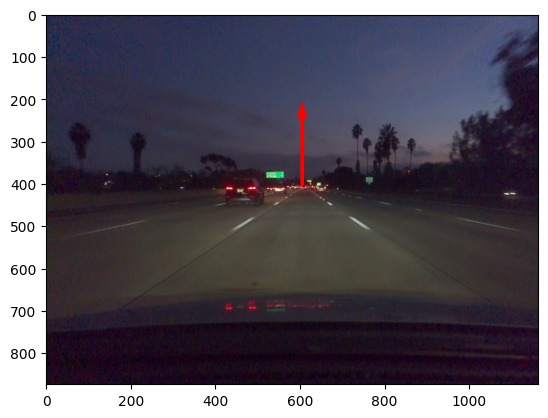

In [ ]:
plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
plt.quiver(center[0], center[1], 0, -200, color='red', angles='xy', scale_units='xy', scale=1)
plt.show()

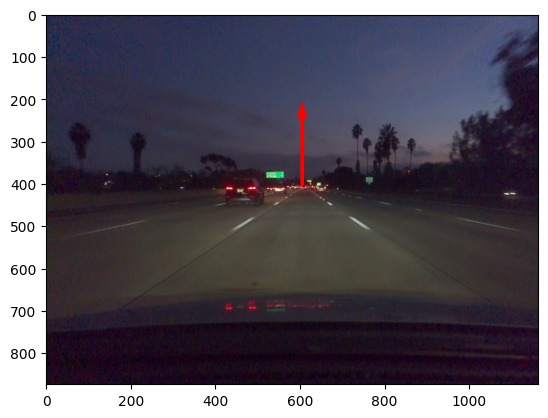

In [ ]:
def extract_flow_points(flow):
  h, w, _ = flow.shape

  qx = []
  qy = []
  qvx = []
  qvy = []

  for i in range(0, h):
    for j in range(0, w):
      flow_vec = 5 * flow[i][j]
      if np.linalg.norm(flow_vec) > 1:
        v = flow_vec
        qx.append(j)
        qy.append(i)
        qvx.append(v[0])
        qvy.append(v[1])

  return (qx, qy, qvx, qvy)

def find_move_direction_by_points(qx, qy, qvx, qvy):
  l_a = []
  l_b = []
  l_c = []

  for i in range(len(qx)):
    # l_l = math.sqrt(qvx[i] * qvx[i] + qvy[i] * qvy[i])
    l_l = 1
    l_a.append(qvy[i] / l_l)
    l_b.append(-qvx[i] / l_l)
    l_c.append(-(l_a[i] * qx[i] + l_b[i] * qy[i]  ))

  l_a = np.array(l_a)
  l_b = np.array(l_b)
  l_c = np.array(l_c)

  center = np.linalg.solve(
    np.array([
        [np.sum((l_a * l_a)), np.sum((l_a * l_b))],
        [np.sum((l_a * l_b)), np.sum((l_b * l_b))],
    ]), np.array(
        [-np.sum((l_a * l_c)), -np.sum((l_b * l_c))]
    )
  )

  return center

def find_move_direction_by_flow(flow):
  qx, qy, qvx, qvy = extract_flow_points(flow)
  return find_move_direction_by_points(qx, qy, qvx, qvy)



cnt = find_move_direction_by_flow(flow)

plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
draw_flow_vecs(flow)
plt.quiver(center[0], center[1], 0, -200, color='red', angles='xy', scale_units='xy', scale=1)
plt.show()

[605.46312828 409.19034433]


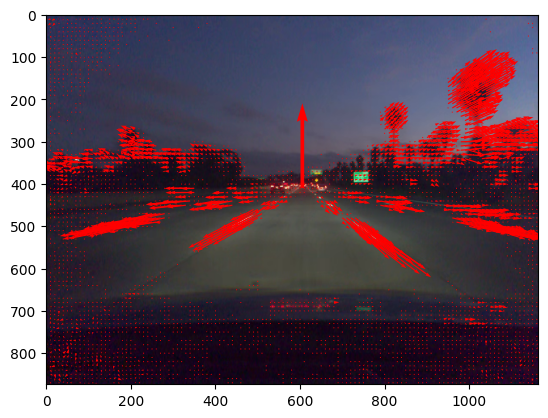

In [ ]:
# (frame2, flow) = get_frame_flow_n(0, 0.5, 3, 15, 3, 5, 1.2, 0)
(frame2, flow) = get_frame_flow_n(int(7.5 * fps_visual), 0.5, 3, 15, 3, 5, 1.2, 0)


cnt = find_move_direction_by_flow(flow)

print(cnt)

plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
draw_flow_vecs(flow)
plt.quiver(cnt[0], cnt[1], 0, -200, color='red', angles='xy', scale_units='xy', scale=1)

plt.show()

[605.09392201 403.25917121]


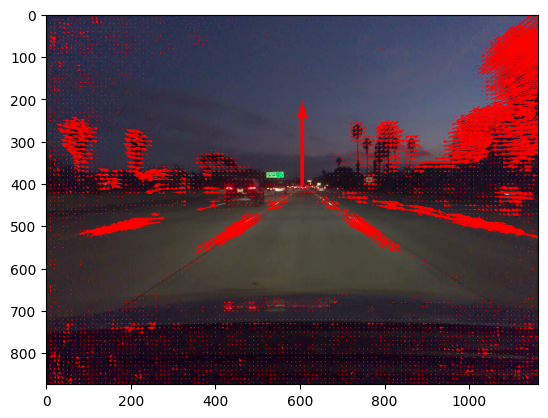

In [ ]:
(frame2, flow) = get_frame_flow_n(0, 0.5, 3, 15, 3, 5, 1.2, 0)
# (frame2, flow) = get_frame_flow_n(int(7.5 * fps_visual), 0.5, 3, 15, 3, 5, 1.2, 0)


cnt = find_move_direction_by_flow(flow)

print(cnt)

plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
draw_flow_vecs(flow)
plt.quiver(cnt[0], cnt[1], 0, -200, color='red', angles='xy', scale_units='xy', scale=1)

plt.show()

In [ ]:
cap = cv2.VideoCapture("0.hevc")


frames_count = 0

prev_gray = None

x_cnt = [0]
y_cnt = [0]

while True:
    ret, frame = cap.read()
    if not ret:
        break

    if frames_count > 20:
      break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    if prev_gray is not None:
      flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
      cnt = find_move_direction_by_flow(flow)
      x_cnt.append(cnt[0])
      y_cnt.append(cnt[1])

    print(frames_count)

    prev_gray = gray
    prev_frame = frame
    frames_count += 1

cap.release()

x_cnt[0] = x_cnt[1]
y_cnt[0] = y_cnt[1]

print(frames_count)


# # Plot the NumPy array
# plt.imshow(frame)
# plt.show()

# print(ret, frame.shape)


0
tf.Tensor(
[[[-0.00154734 -0.04272476]
  [ 0.0015551  -0.06737846]
  [ 0.00484617 -0.07642876]]

 [[-0.00614527 -0.03555337]
  [ 0.00210843 -0.06322448]
  [ 0.00339233 -0.08279071]]

 [[-0.01448434 -0.02447327]
  [-0.0005751  -0.02522986]
  [-0.00092721 -0.03200923]]], shape=(3, 3, 2), dtype=float32)
tf.Tensor(
[[[ 0.0000000e+00  0.0000000e+00 -1.5473358e-03 -4.2724762e-02]
  [ 0.0000000e+00  1.0000000e+00  1.5551012e-03 -6.7378461e-02]
  [ 0.0000000e+00  2.0000000e+00  4.8461668e-03 -7.6428764e-02]]

 [[ 1.0000000e+00  0.0000000e+00 -6.1452664e-03 -3.5553366e-02]
  [ 1.0000000e+00  1.0000000e+00  2.1084300e-03 -6.3224480e-02]
  [ 1.0000000e+00  2.0000000e+00  3.3923294e-03 -8.2790710e-02]]

 [[ 2.0000000e+00  0.0000000e+00 -1.4484345e-02 -2.4473274e-02]
  [ 2.0000000e+00  1.0000000e+00 -5.7510228e-04 -2.5229860e-02]
  [ 2.0000000e+00  2.0000000e+00 -9.2720508e-04 -3.2009229e-02]]], shape=(3, 3, 4), dtype=float32)
elements_2_and_3 tf.Tensor(
[[-0.00154734 -0.04272476]
 [ 0.0015551  -

TypeError: 'NoneType' object is not subscriptable

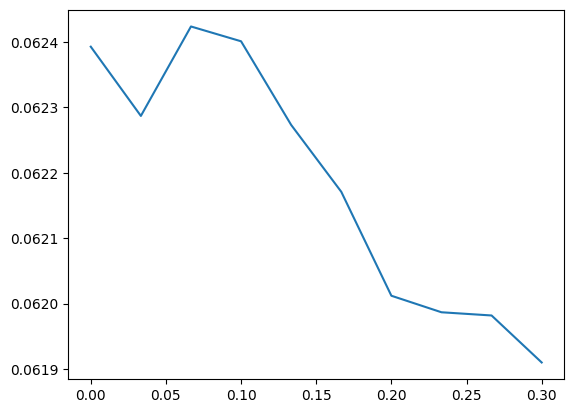

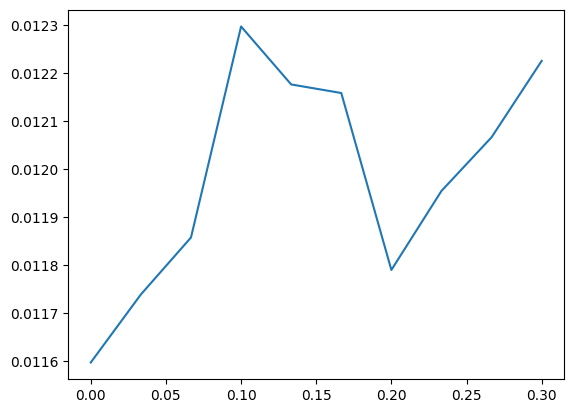

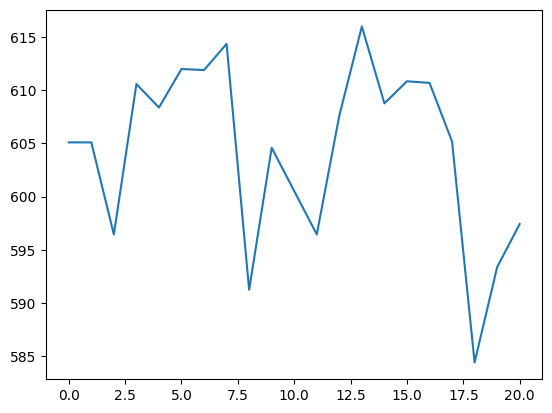

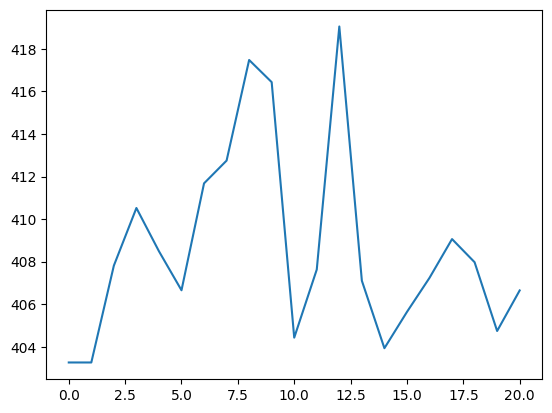

In [ ]:

x_cnt[0] = x_cnt[1]
y_cnt[0] = y_cnt[1]


# print(np.arange(40, 200).shape)
# print(df_list[0][0][40:200].shape)
plt.plot(np.arange(st, en)/fps_visual, df_list[0][0][st:en])
plt.show()
plt.plot(np.arange(st, en)/fps_visual, df_list[0][1][st:en])
plt.show()
len(df_list[0][0])



plt.plot(x_cnt)
plt.show()

plt.plot(y_cnt)
plt.show()

In [ ]:
cap = cv2.VideoCapture("0.hevc")

frames_count = 0

prev_gray = None

x_cnt = [0]
y_cnt = [0]

while True:
    ret, frame = cap.read()
    if not ret:
        break

    #if frames_count > 20:
    #  break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    if prev_gray is not None:
      flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

      # flow_tf = tf.constant(flow)

      h, w, _ = flow.shape

      # sum = 0
      # for i in range(0, h):
      #   for j in range(0, w):
      #     sum = sum + flow[i][j][0]

      # print(sum)
      # print(flow_tf.shape)
      # print(tf.math.reduce_sum(flow_tf[:,..., 0]))
      # print(tf.math.reduce_sum(flow_tf))
      # tf.gather(x, tf.where(x > 5))



    print(frames_count)

    prev_gray = gray
    prev_frame = frame
    frames_count += 1

cap.release()

x_cnt[0] = x_cnt[1]
y_cnt[0] = y_cnt[1]

print(frames_count)


# # Plot the NumPy array
# plt.imshow(frame)
# plt.show()

# print(ret, frame.shape)


0
497783.4322107818
(874, 1164, 2)
tf.Tensor(497783.4, shape=(), dtype=float32)
tf.Tensor(329200.2, shape=(), dtype=float32)
1
469267.4670591721
(874, 1164, 2)
tf.Tensor(469267.5, shape=(), dtype=float32)
tf.Tensor(271903.7, shape=(), dtype=float32)
2
412770.60523944406
(874, 1164, 2)
tf.Tensor(412770.6, shape=(), dtype=float32)
tf.Tensor(283606.0, shape=(), dtype=float32)
3
304264.0803018341
(874, 1164, 2)
tf.Tensor(304264.1, shape=(), dtype=float32)
tf.Tensor(267021.1, shape=(), dtype=float32)
4
171224.5917262748
(874, 1164, 2)
tf.Tensor(171224.6, shape=(), dtype=float32)
tf.Tensor(283012.88, shape=(), dtype=float32)
5
150768.9557242507
(874, 1164, 2)
tf.Tensor(150768.94, shape=(), dtype=float32)
tf.Tensor(211203.94, shape=(), dtype=float32)
6


KeyboardInterrupt: 


Iteration 0
p_20 75.4260131107813
p_90 318.646067112177


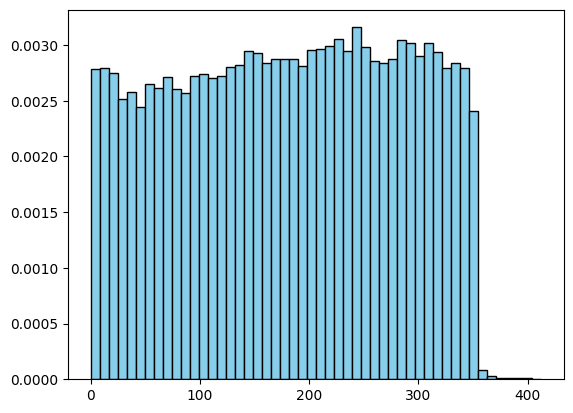

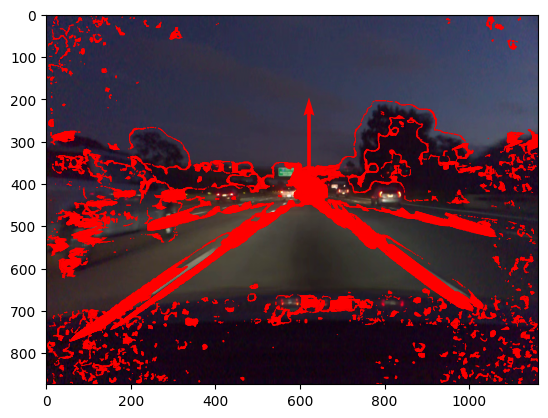


Iteration 1
p_20 14.36569558791598
p_90 68.0736266777676


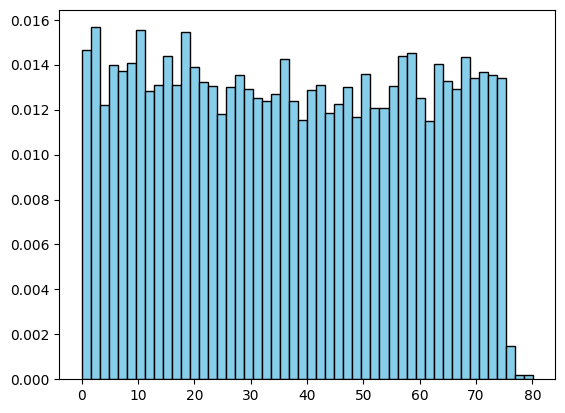

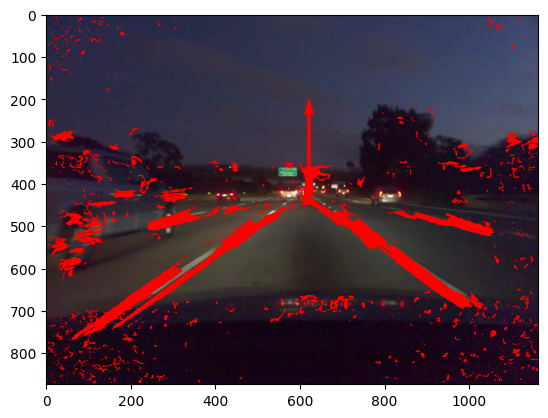


Iteration 2
p_20 2.7300823573336856
p_90 12.743329854864896


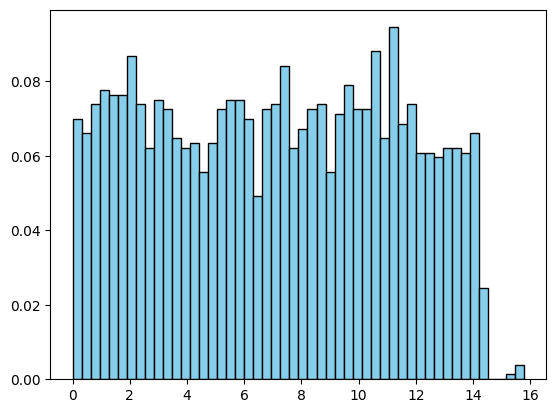

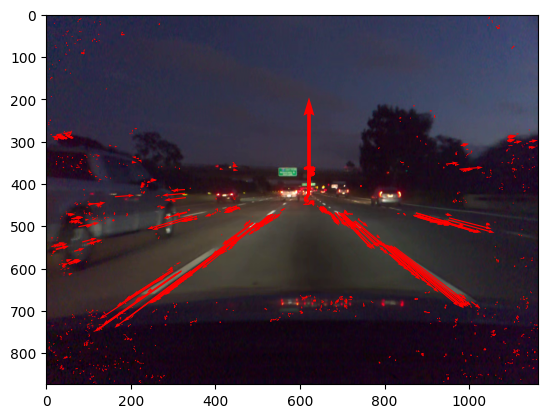


Iteration 3
p_20 0.6027269680562313
p_90 2.4163567668025507


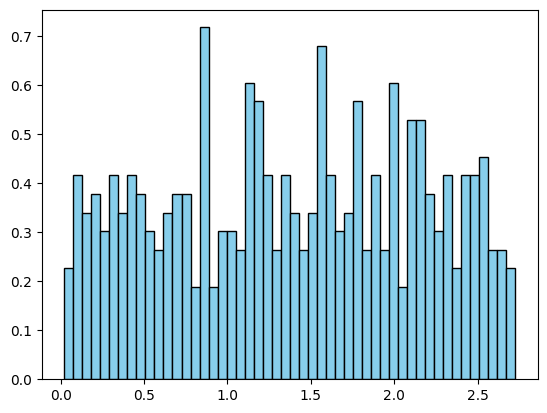

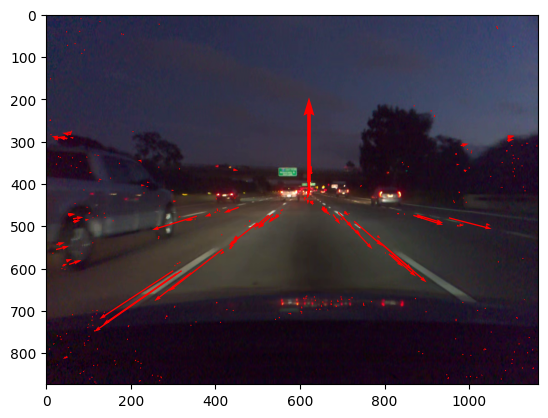

In [ ]:
def extract_flow_points_tf(flow):
  h, w, _ = flow.shape
  flow_tf = 5 * tf.constant(flow, dtype=tf.float64)

  i_indices, j_indices = tf.meshgrid(tf.range(h), tf.range(w), indexing='ij')
  i_indices = tf.cast(tf.expand_dims(i_indices, axis=-1), dtype=tf.float64)
  j_indices = tf.cast(tf.expand_dims(j_indices, axis=-1), dtype=tf.float64)

  # print(flow_tf[0:3, 0:3,...])
  flow_tf = tf.concat([i_indices, j_indices, flow_tf], axis=-1)
  # print(flow_tf[0:3, 0:3,...])

  flattened_flow = tf.reshape(flow_tf, [-1, tf.shape(flow_tf)[-1]])

  elements_2_and_3 = flattened_flow[:, 2:]

  # print("elements_2_and_3", elements_2_and_3[:3])

  # Calculate the vector length using Pythagorean theorem
  # vector_length = tf.expand_dims(tf.sqrt(tf.reduce_sum(elements_2_and_3**2, axis=-1)), axis=-1)
  vector_length = tf.sqrt(tf.reduce_sum(elements_2_and_3**2, axis=-1))

  # print("vector_length", vector_length[:3])

  condition = (vector_length) > 1

  # Create indices for gathering records that satisfy the condition
  indices = tf.where(condition)

  # print("indices", indices[:3])

  # Use tf.gather to get records that satisfy the condition
  flow_filtered = tf.gather_nd(flattened_flow, indices)

  # print("filterd vector_length", tf.gather_nd(vector_length, indices)[:3])
  # print("flow_filtered", flow_filtered[:3])

  return {
      "qx" : tf.squeeze(flow_filtered[:, 1]),
      "qy" : tf.squeeze(flow_filtered[:, 0]),
      "qvx" : tf.squeeze(flow_filtered[:, 2]),
      "qvy" : tf.squeeze(flow_filtered[:, 3])
  }

def list_of_lines_tf(q):
  l_a =  q["qvy"]
  l_b = -q["qvx"]
  l_c = -(l_a * q["qx"] + l_b * q["qy"]  )

  return {
      "l_a": l_a,
      "l_b": l_b,
      "l_c": l_c
  }


def find_move_direction_by_lines_tf(l):

  cnt = np.linalg.solve(
    np.array([
        [tf.math.reduce_sum((l["l_a"] * l["l_a"])), tf.math.reduce_sum((l["l_a"] * l["l_b"]))],
        [tf.math.reduce_sum((l["l_a"] * l["l_b"])), tf.math.reduce_sum((l["l_b"] * l["l_b"]))],
    ]), np.array(
        [-tf.math.reduce_sum((l["l_a"] * l["l_c"])), -tf.math.reduce_sum((l["l_b"] * l["l_c"]))]
    )
  )

  return {
      "c_x": cnt[0],
      "c_y": cnt[1]
  }

def evaluate_accuracy(l, c):
  accuracy = l["l_a"] * c["c_x"] + l["l_b"] * c["c_y"] + l ["l_c"]
  accuracy = tf.abs(accuracy)

  accuracy_sorted = tf.sort(accuracy)

  # print(accuracy)
  # print(accuracy.shape)

  # print("percentile_5 = ", tfp.stats.percentile(accuracy, 5.0).numpy())
  # print("percentile_20 = ", tfp.stats.percentile(accuracy, 20.0).numpy())
  # print("percentile_10 = ", tfp.stats.percentile(accuracy, 10.0).numpy())
  # print("percentile_50 = ", tfp.stats.percentile(accuracy, 50.0).numpy())
  # print("percentile_90 = ", tfp.stats.percentile(accuracy, 90.0).numpy())


  return {
      "accuracy": accuracy,
      "p_20": tfp.stats.percentile(accuracy, 20.0).numpy(),
      "p_90": tfp.stats.percentile(accuracy, 90.0).numpy()
  }

  return

def filter_accuracy(q, p):
  accuracy_index = tf.where((p["accuracy"]) < p["p_20"])
  return {
      "qx": tf.gather_nd(q["qx"], accuracy_index),
      "qy": tf.gather_nd(q["qy"], accuracy_index),
      "qvx": tf.gather_nd(q["qvx"], accuracy_index),
      "qvy": tf.gather_nd(q["qvy"], accuracy_index)
  }

def draw_flow_vecs_tf(q):
  plt.quiver(q["qx"], q["qy"], q["qvx"], q["qvy"], color='red', angles='xy', scale_units='xy', scale=1)

def draw_image(r):
  cnt = r["c"]

  plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
  draw_flow_vecs_tf(r["q"])
  plt.quiver(cnt["c_x"], cnt["c_y"], 0, -200, color='red', angles='xy', scale_units='xy', scale=1)
  plt.show()



def find_move_direction_by_flow_tf(flow, show_report=False):
  q = extract_flow_points_tf(flow)

  l = list_of_lines_tf(q)
  c = find_move_direction_by_lines_tf(l)
  p = evaluate_accuracy(l, c)

  r = None

  for i in range(4):
    q = filter_accuracy(q, p)
    l = list_of_lines_tf(q)
    c = find_move_direction_by_lines_tf(l)
    p = evaluate_accuracy(l, c)

    r = {
      "p": p,
      "c": c,
      "q": q
    }

    if show_report:
      print()
      print("Iteration", i)

      print("p_20", p["p_20"])
      print("p_90", p["p_90"])

      plt.hist(p["accuracy"].numpy(), bins=50, color='skyblue', edgecolor='black', density=True)
      plt.show()

      draw_image(r)

  return r

frame2, flow = get_frame_flow_n(978)

r = find_move_direction_by_flow_tf(flow, True)

In [ ]:
import tensorflow as tf

def tf_cart_product(tensor1, tensor2):
  # Input tensors
  tensor1 = tf.constant([1, 2, 3], dtype=tf.float32)
  tensor2 = tf.constant([20, 30], dtype=tf.float32)

  # Create meshgrid
  indices1, indices2 = tf.meshgrid(tf.range(tf.size(tensor1)), tf.range(tf.size(tensor2)))

  indices1_flat = tf.reshape(indices1, [-1])
  indices2_flat = tf.reshape(indices2, [-1])
  # Gather elements using meshgrid indices
  cartesian_product = tf.stack([tf.gather(tensor1, indices1_flat), tf.gather(tensor2, indices2_flat)], axis=1)

  return cartesian_product

In [ ]:
cap = cv2.VideoCapture("0.hevc")


frames_count = 0

prev_gray = None

x_cnt = [0]
y_cnt = [0]
p90_by_frame=[0]

while True:
  print("Reading...")
  ret, frame = cap.read()
  if not ret:
      break

  clear_output(wait=True)
  print("Caclulating")

  # if frames_count > 20:
  #   break

  gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

  if prev_gray is not None:
    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    r = find_move_direction_by_flow_tf(flow)
    cnt = r["c"]
    p = r["p"]
    x_cnt.append(cnt["c_x"])
    y_cnt.append(cnt["c_y"])
    p90_by_frame.append(p["p_90"])


  print("Calculated", frames_count)

  prev_gray = gray
  prev_frame = frame
  frames_count += 1

cap.release()

x_cnt[0] = x_cnt[1]
y_cnt[0] = y_cnt[1]
p90_by_frame[0] = p90_by_frame[1]

print(frames_count)


# # Plot the NumPy array
# plt.imshow(frame)
# plt.show()

# print(ret, frame.shape)

Caclulating
Calculated 1199
Reading...
1200


Label X vs X


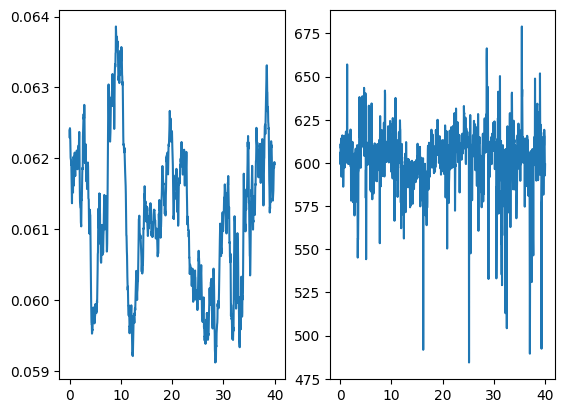

Label X vs Y


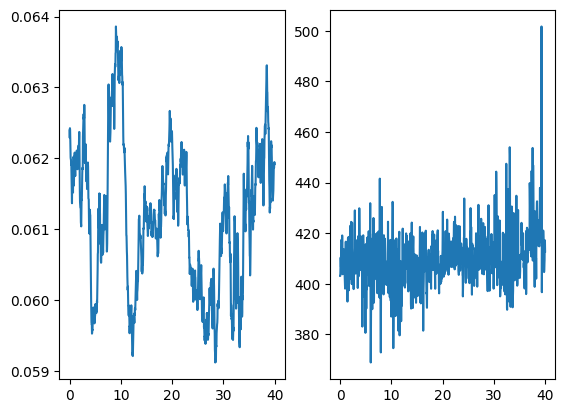

Label Y vs X


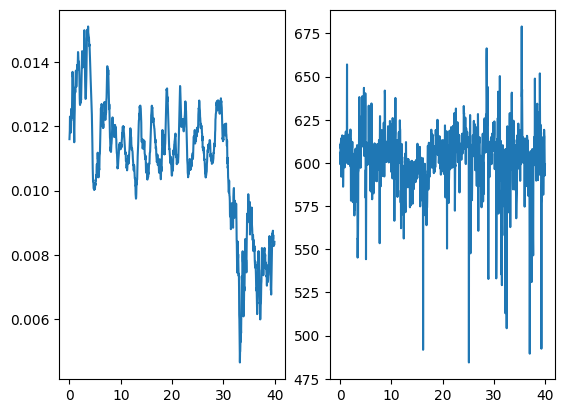

Label Y vs Y


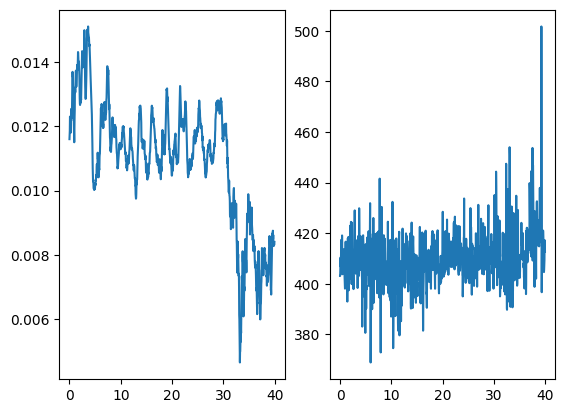

Predicted X


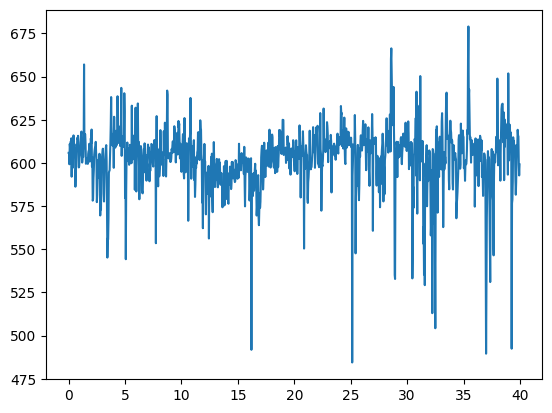

Predicted Y


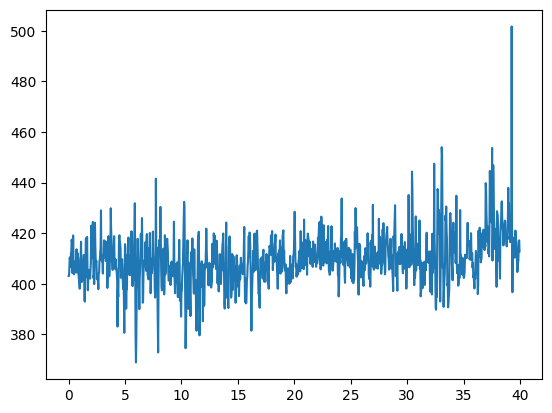

P_90


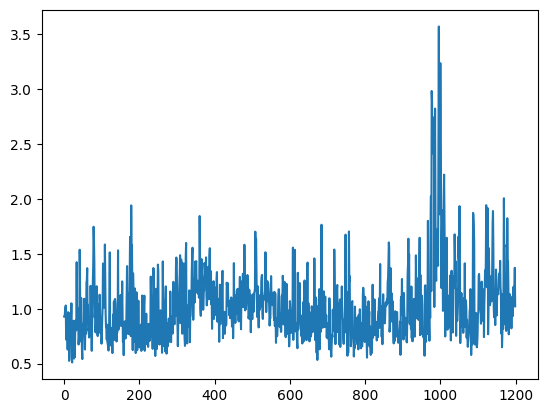

In [ ]:
st = 0
en = frames_number

# st = 977
# en = 980

# print(np.arange(40, 200).shape)
# print(df_list[0][0][40:200].shape)

data = tf.constant(x_cnt)

print("Label X vs X")
plt.subplot(1, 2, 1)
plt.plot(np.arange(st, en)/fps_visual, df_list[0][0][st:en])
plt.subplot(1, 2, 2)
plt.plot(np.arange(st, en)/fps_visual, x_cnt[st:en])
plt.show()

print("Label X vs Y")
plt.subplot(1, 2, 1)
plt.plot(np.arange(st, en)/fps_visual, df_list[0][0][st:en])
plt.subplot(1, 2, 2)
plt.plot(np.arange(st, en)/fps_visual, y_cnt[st:en])
plt.show()

print("Label Y vs X")
plt.subplot(1, 2, 1)
plt.plot(np.arange(st, en)/fps_visual, df_list[0][1][st:en])
plt.subplot(1, 2, 2)
plt.plot(np.arange(st, en)/fps_visual, x_cnt[st:en])
plt.show()

print("Label Y vs Y")
plt.subplot(1, 2, 1)
plt.plot(np.arange(st, en)/fps_visual, df_list[0][1][st:en])
plt.subplot(1, 2, 2)
plt.plot(np.arange(st, en)/fps_visual, y_cnt[st:en])
plt.show()
len(df_list[0][0])


print("Predicted X")
plt.plot(np.arange(st, en)/fps_visual, x_cnt[st:en])
plt.show()



print("Predicted Y")
plt.plot(np.arange(st, en)/fps_visual, y_cnt[st:en])
plt.show()

print("P_90")
plt.plot(np.arange(st, en), p90_by_frame[st:en])
plt.show()

(1199,)
(1199,)
